# Beta Band Activity During Gait

This notebook runs through the pipeline of analyzing EEG beta activity during walking. The dataset was downloaded from OpenNeuro, "Noelle A. Jacobsen and Daniel P. Ferris (2023). Mobile EEG split-belt walking study. OpenNeuro. [Dataset] doi: doi:10.18112/openneuro.ds004475.v1.0.3"

Here we will:

- Load the dataset  
- Understand what is inside the raw EEG file  
- Preprocess the data
        - Filtering
        - Rereferencing
        - Removing line noise
- Run ICA to clean artifacts  
- Epoch around gait events  
- Compute beta-band power (ERSP)  

## Load imports


In [21]:
import os
import numpy as np
from utils.config import dir_data
import mne
import pandas as pd
import matplotlib.pyplot as plt
from meegkit.asr import ASR, clean_windows
from mne.preprocessing import ICA
from mne_bids import BIDSPath, read_raw_bids, print_dir_tree
from mne_icalabel import label_components
from mne.time_frequency import tfr_morlet
from autoreject import AutoReject

## Directory sanity check

In [22]:
print("Current Working Directory:", os.getcwd())

Current Working Directory: c:\Vaishali\NG\Multiversebeta\betaGaitMultiverse


## Load BIDS dataset

In [23]:
data_root = dir_data/'ds004475'
subject_label = 'S18'

print_dir_tree(data_root, max_depth=3)

bids_path = BIDSPath(
    subject=subject_label,
    task='task',
    root=data_root,
    datatype='eeg'
)

raw = read_raw_bids(bids_path=bids_path)
raw

|ds004475\
|--- .bidsignore
|--- CHANGES
|--- README
|--- dataset_description.json
|--- participants.json
|--- participants.tsv
|--- task-task_events.json
|--- sourcedata\
|------ data_dictionary.xlsx
|--- sub-S18\
|------ anat\
|------ eeg\
|--------- sub-S18_task-task_channels.tsv
|--------- sub-S18_task-task_coordsystem.json
|--------- sub-S18_task-task_eeg.fdt
|--------- sub-S18_task-task_eeg.json
|--------- sub-S18_task-task_eeg.set
|--------- sub-S18_task-task_electrodes.tsv
|--------- sub-S18_task-task_events.tsv
|------ headmodel\
|--------- sub-S18_elec_aligned.mat
|--------- sub-S18_headmodel_fem_tr.mat
|--------- sub-S18_leadfield.mat
|--- sub-S19\
|------ anat\
|------ eeg\
|--------- sub-S19_task-task_channels.tsv
|--------- sub-S19_task-task_coordsystem.json
|--------- sub-S19_task-task_eeg.fdt
|--------- sub-S19_task-task_eeg.json
|--------- sub-S19_task-task_eeg.set
|--------- sub-S19_task-task_electrodes.tsv
|--------- sub-S19_task-task_events.tsv
|------ headmodel\
|-

C:\Users\Vaishali\AppData\Local\Temp\ipykernel_34164\2336472402.py:13: RuntimeWarning: Unknown types found, setting as type EEG:
fz: ['Fz1', 'Fz2']
noise: ['2-A1', '2-A10', '2-A11', '2-A12', '2-A13', '2-A14', '2-A15', '2-A16', '2-A17', '2-A18', '2-A19', '2-A2', '2-A20', '2-A21', '2-A22', '2-A23', '2-A24', '2-A26', '2-A27', '2-A28', '2-A29', '2-A3', '2-A30', '2-A31', '2-A32', '2-A4', '2-A5', '2-A6', '2-A7', '2-A8', '2-A9', '2-B1', '2-B10', '2-B11', '2-B12', '2-B13', '2-B14', '2-B15', '2-B16', '2-B17', '2-B18', '2-B19', '2-B2', '2-B20', '2-B21', '2-B22', '2-B23', '2-B24', '2-B25', '2-B26', '2-B27', '2-B28', '2-B29', '2-B3', '2-B30', '2-B31', '2-B32', '2-B4', '2-B5', '2-B6', '2-B7', '2-B8', '2-B9', '2-C1', '2-C10', '2-C11', '2-C12', '2-C13', '2-C14', '2-C15', '2-C16', '2-C17', '2-C18', '2-C19', '2-C2', '2-C20', '2-C21', '2-C22', '2-C23', '2-C24', '2-C25', '2-C26', '2-C27', '2-C28', '2-C29', '2-C3', '2-C30', '2-C31', '2-C32', '2-C4', '2-C5', '2-D1', '2-D10', '2-D11', '2-D12', '2-D13', '2-D

Reading events from C:\Vaishali\NG\Multiversebeta\betaGaitMultiverse\data\ds004475\sub-S18\eeg\sub-S18_task-task_events.tsv.


C:\Users\Vaishali\AppData\Local\Temp\ipykernel_34164\2336472402.py:13: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = read_raw_bids(bids_path=bids_path)
C:\Users\Vaishali\AppData\Local\Temp\ipykernel_34164\2336472402.py:13: RuntimeWarning: Not setting positions of 8 emg channels found in montage:
['1-EXG1', '1-EXG2', '1-EXG3', '1-EXG4', '1-EXG5', '1-EXG6', '1-EXG7', '1-EXG8']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path=bids_path)


Reading channel info from C:\Vaishali\NG\Multiversebeta\betaGaitMultiverse\data\ds004475\sub-S18\eeg\sub-S18_task-task_channels.tsv.
Reading electrode coords from C:\Vaishali\NG\Multiversebeta\betaGaitMultiverse\data\ds004475\sub-S18\eeg\sub-S18_task-task_electrodes.tsv.


C:\Users\Vaishali\AppData\Local\Temp\ipykernel_34164\2336472402.py:13: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['1-EXG1', '1-EXG2', '1-EXG3', '1-EXG4', '1-EXG5', '1-EXG6', '1-EXG7', '1-EXG8', '2-A1', '2-A2', '2-A3', '2-A4', '2-A5', '2-A6', '2-A7', '2-A8', '2-A9', '2-A10', '2-A11', '2-A12', '2-A13', '2-A14', '2-A15', '2-A16', '2-A17', '2-A18', '2-A19', '2-A20', '2-A21', '2-A22', '2-A23', '2-A24', '2-A26', '2-A27', '2-A28', '2-A29', '2-A30', '2-A31', '2-A32', '2-B1', '2-B2', '2-B3', '2-B4', '2-B5', '2-B6', '2-B7', '2-B8', '2-B9', '2-B10', '2-B11', '2-B12', '2-B13', '2-B14', '2-B15', '2-B16', '2-B17', '2-B18', '2-B19', '2-B20', '2-B21', '2-B22', '2-B23', '2-B24', '2-B25', '2-B26', '2-B27', '2-B28', '2-B29', '2-B30', '2-B31', '2-B32', '2-C1', '2-C2', '2-C3', '2-C4', '2-C5', '2-C10', '2-C11', '2-C12', '2-C13', '2-C14', '2-C15', '2-C16', '2-C17', '2-C18', '2-C19', '2-C20', '2-C21', '2-C22', '2-C23', '2-C24', '2-C25', '2-C26', '2-C27', '2-C28', '

<RawEEGLAB | sub-S18_task-task_eeg.fdt, 255 x 1657344 (3237.0 s), ~239 KiB, data not loaded>

## Channel information


In [24]:
# Identify noise layer channels
noise_chs = [ch for ch in raw.ch_names if ch.startswith("2-")]
emg_chs = [ch for ch in raw.ch_names if ch.startswith("1-EXG")]

raw.drop_channels(noise_chs + emg_chs)

# Keep only EEG channels
raw_eeg = raw.pick_types(eeg=True)

print(f"Remaining channels: {len(raw.ch_names)}")

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


Remaining channels: 122


4 duplicate electrode labels found:
T7/T3, T8/T4, P7/T5, P8/T6
Plotting 90 unique labels.


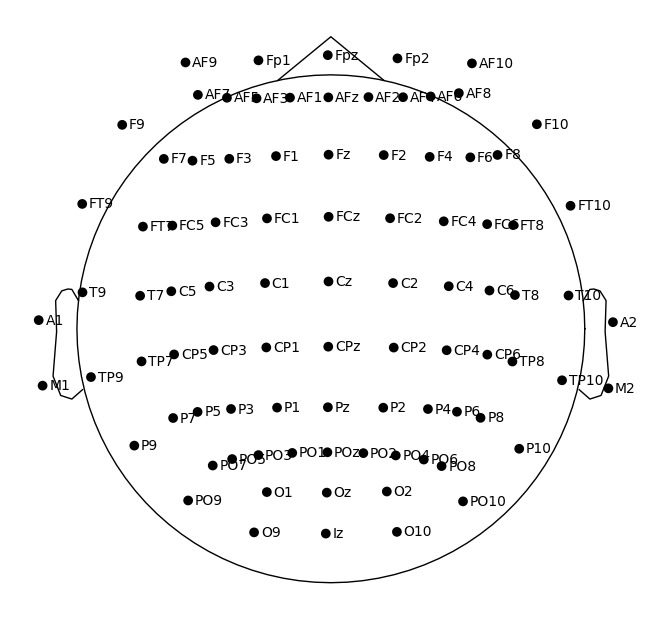

In [25]:
# Display montage
m = mne.channels.make_standard_montage('standard_1020')
m.plot(show_names=True);

## Preprocessing
### Filtering

In [26]:
# raw = read_raw_bids(bids_path=bids_path)
raw_eeg.load_data()

raw_eeg.filter(
    l_freq=1.0,
    h_freq=None,
    method="iir",
    iir_params=dict(order=2, ftype='butter'),
    phase='zero'
)

Reading 0 ... 1657343  =      0.000 ...  3236.998 secs...
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

IIR filter parameters
---------------------
Butterworth highpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 4 (effective, after forward-backward)
- Cutoff at 1.00 Hz: -6.02 dB



<RawEEGLAB | sub-S18_task-task_eeg.fdt, 122 x 1657344 (3237.0 s), ~1.51 GiB, data loaded>

### Re-Reference

In [27]:
raw_eeg.set_eeg_reference("average", projection=False)

EEG channel type selected for re-referencing
Applying average reference.


Applying a custom ('EEG',) reference.


<RawEEGLAB | sub-S18_task-task_eeg.fdt, 122 x 1657344 (3237.0 s), ~1.51 GiB, data loaded>

### Remove Line Noise

In [28]:
raw_eeg.notch_filter(freqs=50)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 s)



<RawEEGLAB | sub-S18_task-task_eeg.fdt, 122 x 1657344 (3237.0 s), ~1.51 GiB, data loaded>

## ASR

In [29]:
from meegkit.asr import ASR, clean_windows
sfreq = raw_eeg.info['sfreq']
data = raw_eeg.get_data()     
print(data.shape)

(122, 1657344)


In [30]:
data = raw_eeg.get_data().astype(np.float64)

# Remove flat channels (ASR hates them)
stds = np.std(data, axis=1)
good = stds > 1e-12
data = data[good]

In [31]:
calib_start = int(120 * sfreq)
calib_stop  = int(240 * sfreq)
train_idx = np.arange(calib_start, calib_stop)

In [32]:
asr = ASR(
    method="euclid",
    sfreq=sfreq,
    cutoff=40,                # more tolerant
    min_clean_fraction=0.1,   # allow dirtier data
    max_dropout_fraction=0.2
)
print("Calibration duration (s):", calib.shape[1] / sfreq)

Calibration duration (s): 60.0


In [33]:
calib = calib - np.mean(calib, axis=1, keepdims=True)

In [34]:
_, sample_mask = asr.fit(calib)

ValueError: setting an array element with a sequence.

In [9]:
asr = ASR(
    sfreq=raw_eeg.info['sfreq'],
    cutoff=30
)

# 5️⃣ Fit directly on continuous data
asr.fit(data)

# 6️⃣ Transform
data_clean = asr.transform(data)

# 7️⃣ Put back into MNE
raw_eeg_clean = raw_eeg.copy()
raw_eeg_clean._data = data_clean


ValueError: setting an array element with a sequence.

## Cropping dataset
The dataset consists of a 40-minute recording":

    0–15 min → pre-adaptation
    15–30 min → split-belt adaptation
    30–40 min → post-adaptation

We are only interested in the 15 min "adaptation" phase so let's crop only this part. The gait events are already in the dataset for each subject "sub-S18_task-task_events.tsv". The first step is the understand what the file consists of.


In [35]:
events_path = os.path.join(
    dir_data,
    "ds004475",
    "sub-S18",
    "eeg",
    "sub-S18_task-task_events.tsv"
)

events_df = pd.read_csv(events_path, sep="\t", header=None)
events_df.columns = ["onset", "duration", "sample", "trial_type"]
events_df = events_df[events_df['onset'] != 'onset']  # remove the header row
events_df['onset'] = events_df['onset'].astype(float)
events_df['duration'] = events_df['duration'].astype(float)
events_df['sample'] = events_df['sample'].astype(float)

print(events_df["trial_type"].unique())

<StringArray>
[ '9633791',      'RHS',      'LHS',      'RTO',      'LTO',     'TRIG',
       'B1',   'BUTTON',       'B2',   'End B1',       'B3',   'End B2',
      'SB1',   'End B3',       'P1',  'End SB1',   'End P1', 'boundary',
      'SB2',       'P2',  'End SB2',   'End P2']
Length: 22, dtype: str


In [36]:
blocks = events_df[events_df["trial_type"].isin(["B1","B2","B3",
                                                 "End B1","End B2","End B3"])]

blocks = blocks[["onset","trial_type"]]
blocks["onset"] = blocks["onset"].astype(float)

print(blocks.sort_values("onset"))

           onset trial_type
15     27.773438         B1
978   332.732422         B2
979   332.732422     End B1
2238  633.085938         B3
2239  633.085938     End B2
3277  932.296875     End B3


## Isolate adaptation block
From the output, B2 seems to be the split-belt adaptation phase we are interested in.

In [37]:
b2_onset = events_df.loc[events_df['trial_type'] == 'B2', 'onset'].values[0]
b2_end   = events_df.loc[events_df['trial_type'] == 'End B2', 'onset'].values[0]

In [38]:
split_belt_start = b2_onset 
split_belt_end = b2_end     

In [39]:
# Crop raw EEG to split-belt block
raw_split = raw.copy().crop(tmin=b2_onset, tmax=b2_end)

# Quick check
print(raw_split)

<RawEEGLAB | sub-S18_task-task_eeg.fdt, 122 x 153782 (300.4 s), ~143.3 MiB, data loaded>


## Epoching gait events
Considering our gait cycle from RHS -> RHS, let's create epochs based on the event labels

In [46]:
# get RHS sample indices
rhs_samples = events_df[events_df[:, 2] == event_id['RHS'], 0]

# convert to seconds
sfreq = raw_split.info['sfreq']
rhs_times = rhs_samples / sfreq

# compute cycle durations
cycle_durations = np.diff(rhs_times)

print("Mean gait cycle duration:", np.mean(cycle_durations))
print("Std gait cycle duration:", np.std(cycle_durations))

InvalidIndexError: (slice(None, None, None), 2)

In [43]:
mean_cycle = np.mean(cycle_durations)

epochs = mne.Epochs(
    raw_split,
    events_df,
    event_id={'RHS': event_id['RHS']},
    tmin=0,
    tmax=mean_cycle,
    baseline=None,
    preload=True
)

NameError: name 'cycle_durations' is not defined

In [31]:
print(epochs)

<Epochs | 271 events (all good), 0 – 1.102 s (baseline off), ~298.1 MiB, data loaded,
 'RHS': 271>


## Using Autoreject to for automated artifact rejection

In [ ]:
ar = AutoReject(
    n_interpolate=[1, 2, 3, 4],
    random_state=11,
    n_jobs=1,
    verbose=True
)

# Fit on a subset for speed
ar.fit(epochs[:20])

epochs_ar, reject_log = ar.transform(epochs, return_log=True)

print("Original epochs:", len(epochs))
print("Remaining after autoreject:", len(epochs_ar))

c:\Vaishali\NG\Multiversebeta\betaGaitMultiverse\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Running autoreject on ch_type=eeg


100%|██████████| Creating augmented epochs : 122/122 [00:03<00:00,   32.07it/s]
100%|██████████| Computing thresholds ... : 122/122 [00:34<00:00,    3.54it/s]





















100%|██████████| Repairing epochs : 20/20 [00:01<00:00,   18.36it/s]





















100%|██████████| Repairing epochs : 20/20 [00:01<00:00,   12.61it/s]






















100%|██████████| Fold : 10/10 [00:06<00:00,    1.52it/s]





















100%|██████████| Repairing epochs : 20/20 [00:01<00:00,   18.03it/s]






















100%|██████████| Fold : 10/10 [00:04<00:00,    2.47it/s]





















100%|██████████| Repairing epochs : 20/20 [00:01<00:00,   19.37it/s]






















100%|██████████| Fold : 10/10 [00:03<00:00,    2.52it/s]





















100%|██████████| Repairing epochs : 20/20 [00:01<00:00,   18.24it/s]






















100%|██████████| Fold : 10/10 [00:03<00:00,    2.63it/s]
100%|██████████| n_interp : 4/4 [00:25<00:00,    6.30s/it]






Estimated consensus=0.40 and n_interpolate=4


















































































































































































































































































100%|██████████| Repairing epochs : 271/271 [00:38<00:00,    7.01it/s]


Dropped 13 epochs: 28, 29, 30, 41, 94, 95, 109, 132, 159, 224, 242, 250, 252
Original epochs: 271
Remaining after autoreject: 258


## ICA

In [33]:
ica = mne.preprocessing.ICA(random_state=99)

ica.fit(epochs[~reject_log.bad_epochs])

Fitting ICA to data using 122 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 119 components
Fitting ICA took 80.2s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,241 iterations on epochs (145770 samples)
ICA components,119
Available PCA components,122
Channel types,eeg
ICA components marked for exclusion,—


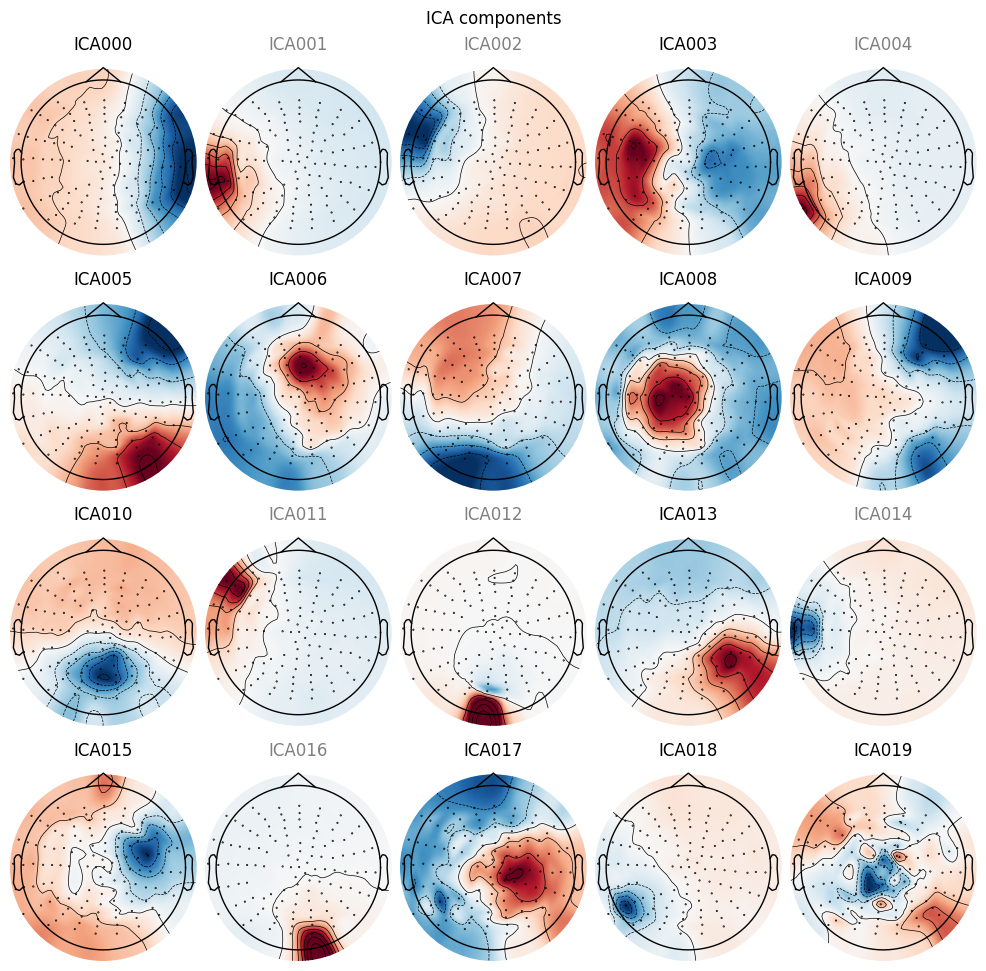

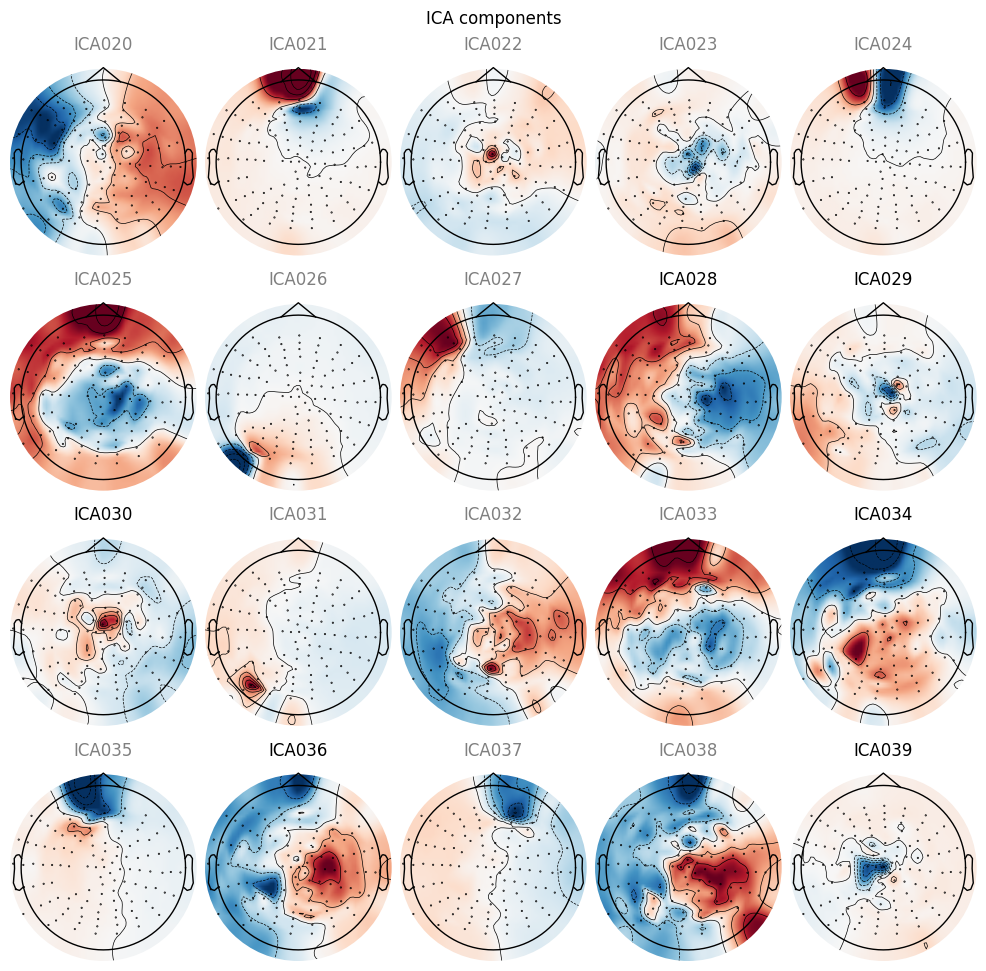

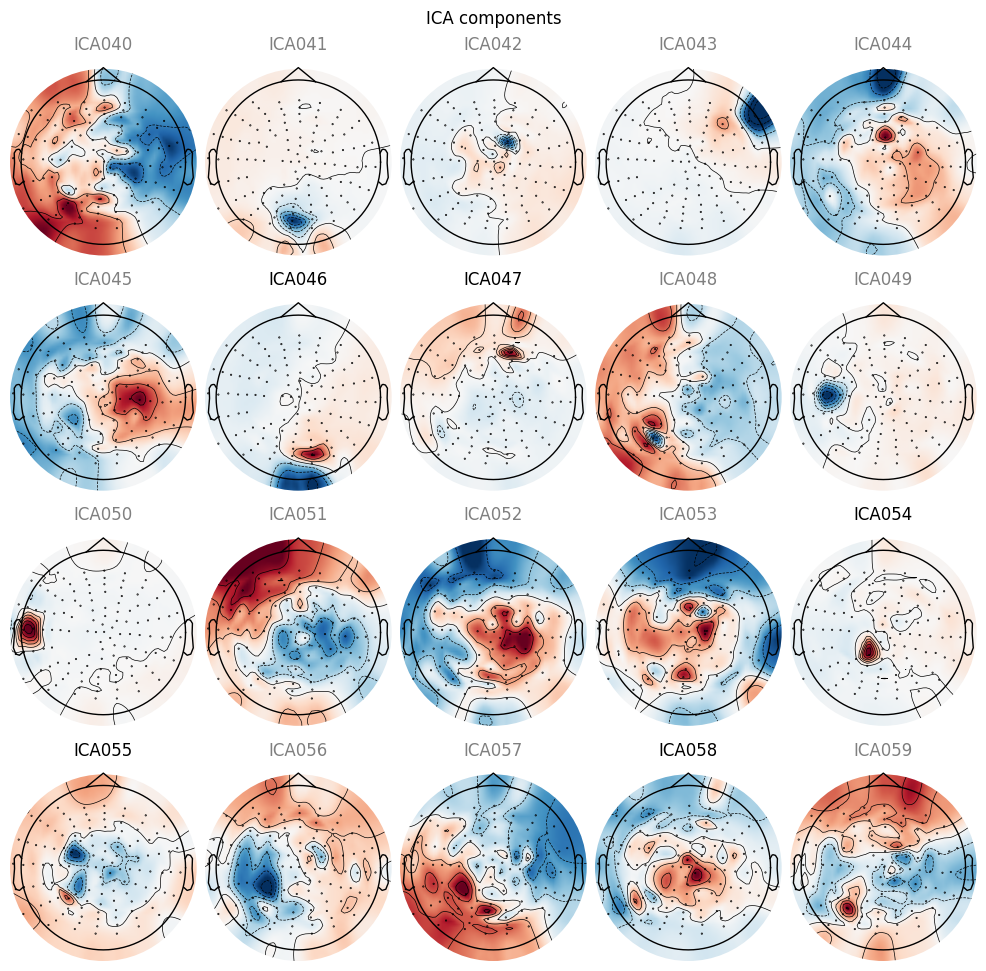

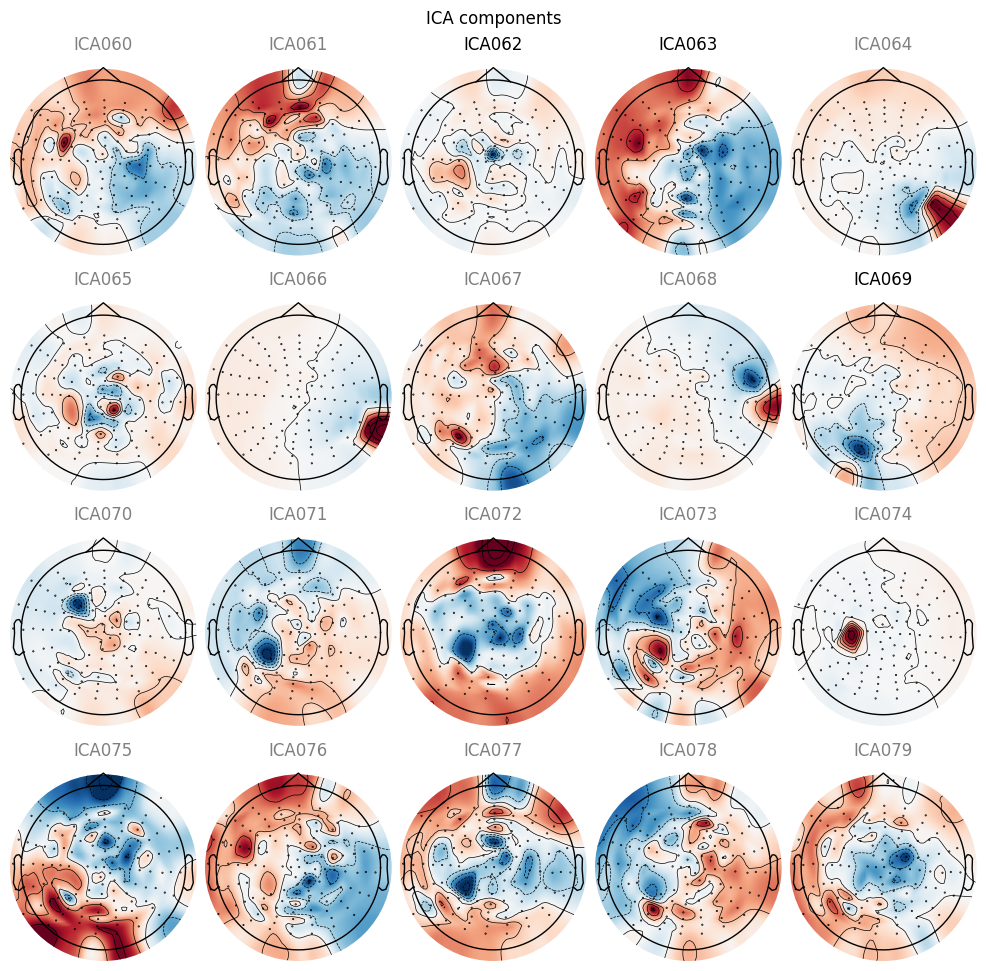

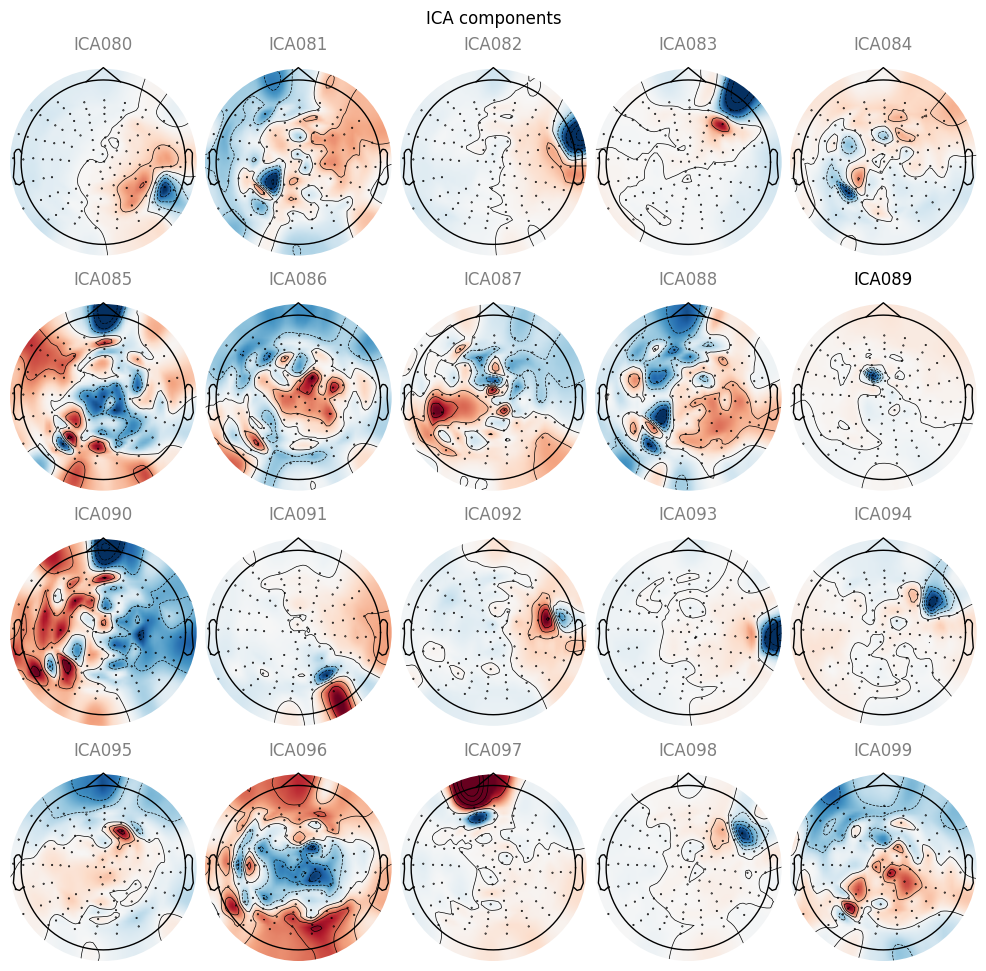

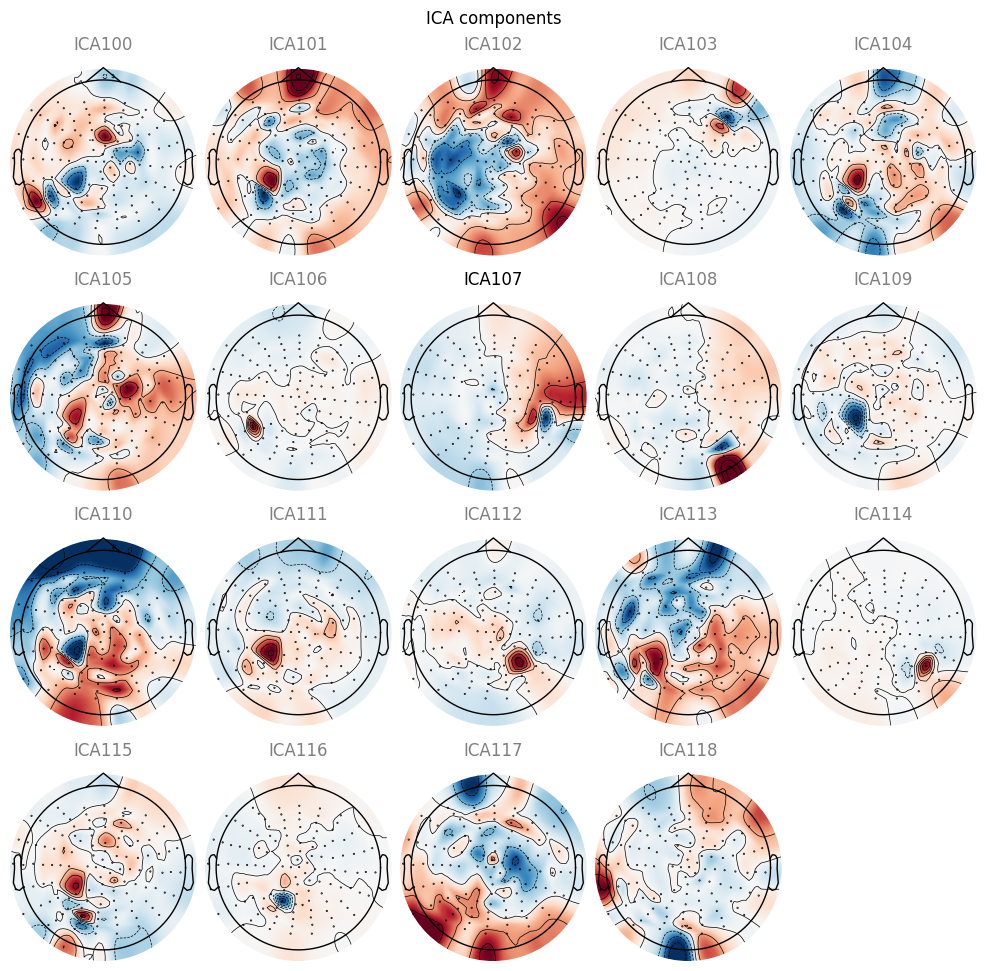

Applying ICA to Raw instance
    Transforming to ICA space (119 components)
    Zeroing out 91 ICA components
    Projecting back using 122 PCA components


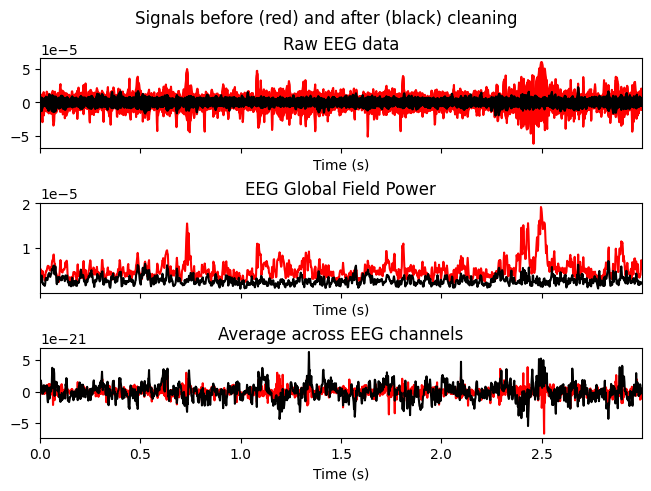

In [60]:
ica.plot_components();
# blinks
ica.plot_overlay(raw_split, exclude=[0], picks="eeg");

Creating RawArray with float64 data, n_channels=119, n_times=153782
    Range : 170359 ... 324140 =    332.732 ...   633.086 secs
Ready.


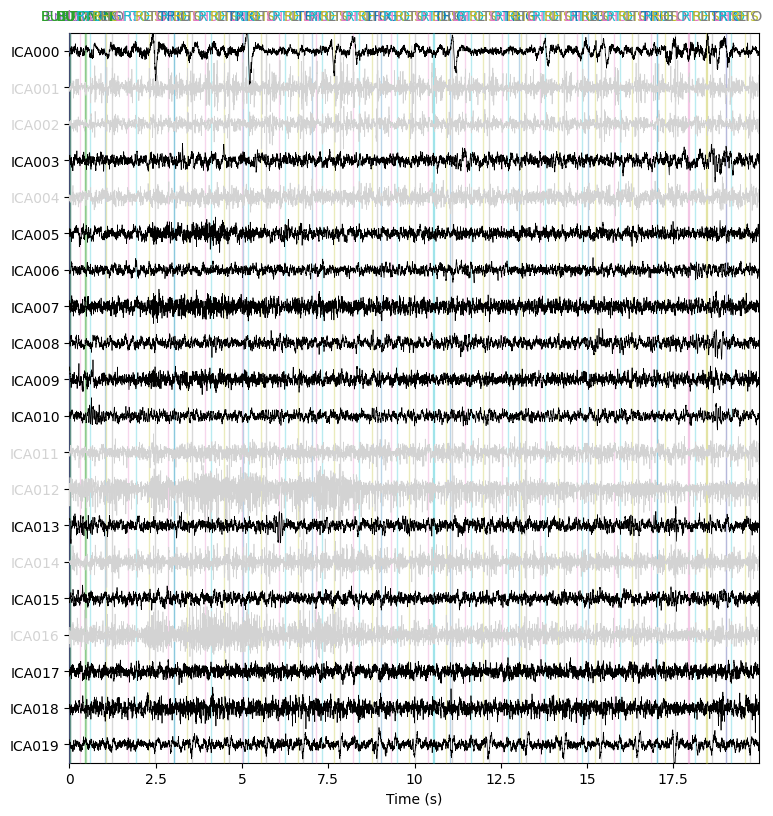

In [61]:
raw_split.load_data()
ica.plot_sources(raw_split, show_scrollbars=False, show=True);

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1618 matching events found
No baseline correction applied
0 projection items activated


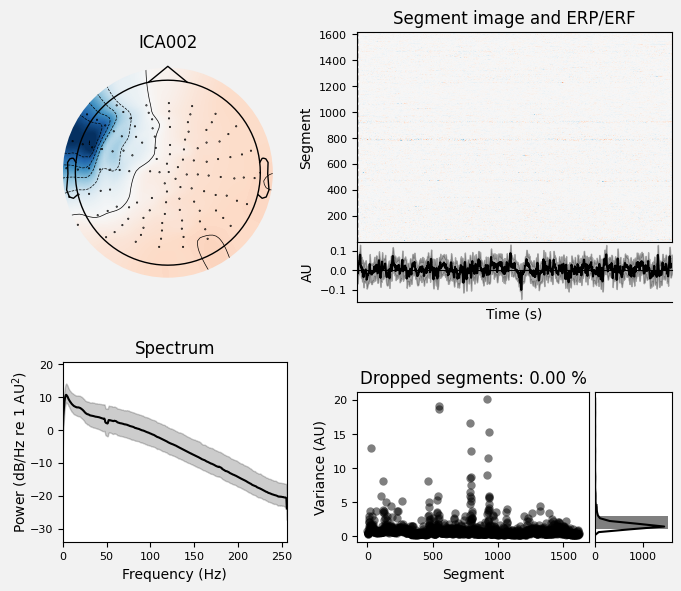

[<Figure size 700x600 with 6 Axes>]

In [40]:
ica.plot_properties(raw, picks=[2])

In [44]:
from mne_icalabel import label_components

ic_labels = label_components(epochs, ica, method="iclabel")

C:\Users\Vaishali\AppData\Local\Temp\ipykernel_37904\67015919.py:3: RuntimeWarning: The provided Epochs instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  ic_labels = label_components(epochs, ica, method="iclabel")
C:\Users\Vaishali\AppData\Local\Temp\ipykernel_37904\67015919.py:3: RuntimeWarning: The provided ICA instance was fitted with a 'fastica' algorithm. ICLabel was designed with extended infomax ICA decompositions. To use the extended infomax algorithm, use the 'mne.preprocessing.ICA' instance with the arguments 'ICA(method='infomax', fit_params=dict(extended=True))' (scikit-learn) or 'ICA(method='picard', fit_params=dict(ortho=False, extended=True))' (python-picard).
  ic_labels = label_components(epochs, ica, method="iclabel")


In [45]:
print(ic_labels["labels"])

['brain', 'muscle artifact', 'muscle artifact', 'brain', 'muscle artifact', 'brain', 'brain', 'brain', 'brain', 'brain', 'brain', 'other', 'muscle artifact', 'brain', 'muscle artifact', 'brain', 'muscle artifact', 'brain', 'brain', 'brain', 'heart beat', 'muscle artifact', 'other', 'heart beat', 'muscle artifact', 'other', 'muscle artifact', 'other', 'brain', 'brain', 'brain', 'heart beat', 'other', 'other', 'brain', 'eye blink', 'brain', 'muscle artifact', 'other', 'brain', 'other', 'muscle artifact', 'other', 'muscle artifact', 'other', 'other', 'brain', 'brain', 'other', 'other', 'channel noise', 'other', 'other', 'other', 'brain', 'brain', 'other', 'other', 'brain', 'muscle artifact', 'other', 'other', 'brain', 'brain', 'muscle artifact', 'heart beat', 'muscle artifact', 'eye blink', 'muscle artifact', 'brain', 'other', 'other', 'other', 'other', 'channel noise', 'other', 'other', 'other', 'other', 'other', 'muscle artifact', 'heart beat', 'muscle artifact', 'muscle artifact', 'oth

In [51]:
exclude = [
    idx for idx, label in enumerate(ic_labels["labels"])
    if label != "brain"
]

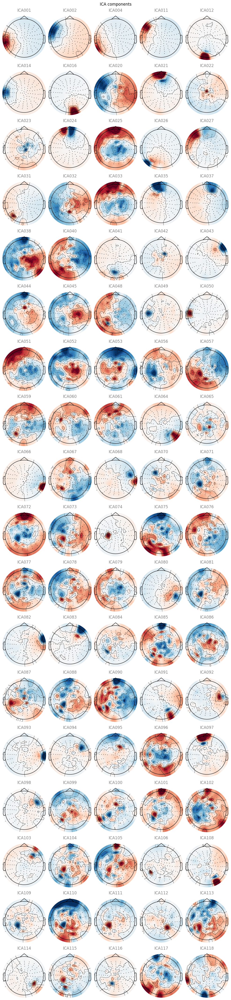

In [54]:
ica.plot_components(exclude)
ica.exclude = exclude

Applying ICA to Evoked instance
    Transforming to ICA space (119 components)
    Zeroing out 90 ICA components
    Projecting back using 122 PCA components


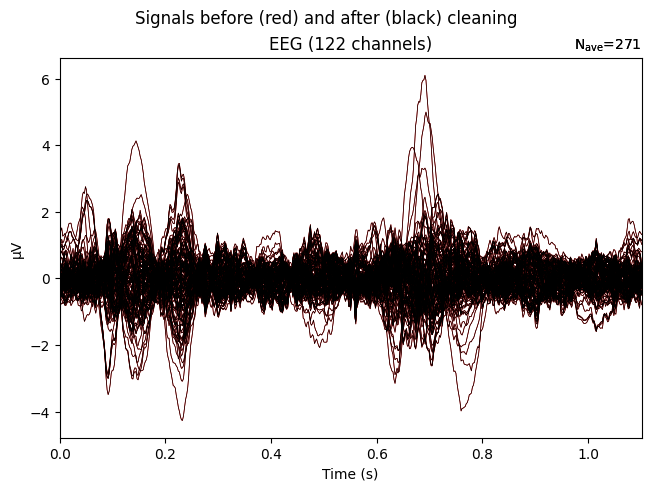

Applying ICA to Epochs instance
    Transforming to ICA space (119 components)
    Zeroing out 90 ICA components
    Projecting back using 122 PCA components


<Epochs | 271 events (all good), 0 – 1.102 s (baseline off), ~298.1 MiB, data loaded,
 'RHS': 271>

In [55]:
ica.plot_overlay(epochs.average(), exclude=ica.exclude)
ica.apply(epochs, exclude=ica.exclude)

In [48]:
ica.apply(epochs)

Applying ICA to Epochs instance
    Transforming to ICA space (119 components)
    Zeroing out 90 ICA components
    Projecting back using 122 PCA components


<Epochs | 271 events (all good), 0 – 1.102 s (baseline off), ~298.1 MiB, data loaded,
 'RHS': 271>

In [49]:
ar2 = AutoReject(
    n_interpolate=[1, 2, 3, 4],
    random_state=11,
    n_jobs=1,
    verbose=True
)

ar2.fit(epochs[:20])
epochs_clean, reject_log2 = ar2.transform(epochs, return_log=True)

print("Final number of epochs:", len(epochs_clean))

Running autoreject on ch_type=eeg


100%|██████████| Creating augmented epochs : 122/122 [00:03<00:00,   31.98it/s]
100%|██████████| Computing thresholds ... : 122/122 [00:35<00:00,    3.39it/s]





















100%|██████████| Repairing epochs : 20/20 [00:00<00:00,   28.48it/s]





















100%|██████████| Repairing epochs : 20/20 [00:00<00:00,   21.49it/s]






















100%|██████████| Fold : 10/10 [00:04<00:00,    2.47it/s]





















100%|██████████| Repairing epochs : 20/20 [00:00<00:00,   20.46it/s]






















100%|██████████| Fold : 10/10 [00:03<00:00,    2.52it/s]





















100%|██████████| Repairing epochs : 20/20 [00:00<00:00,   21.69it/s]






















100%|██████████| Fold : 10/10 [00:04<00:00,    2.49it/s]





















100%|██████████| Repairing epochs : 20/20 [00:00<00:00,   21.33it/s]






















100%|██████████| Fold : 10/10 [00:03<00:00,    2.73it/s]
100%|██████████| n_interp : 4/4 [00:20<00:00,    5.17s/it]






Estimated consensus=0.50 and n_interpolate=4


















































































































































































































































































100%|██████████| Repairing epochs : 271/271 [00:40<00:00,    6.69it/s]


Dropped 11 epochs: 28, 29, 30, 41, 94, 95, 132, 159, 224, 242, 250
Final number of epochs: 260


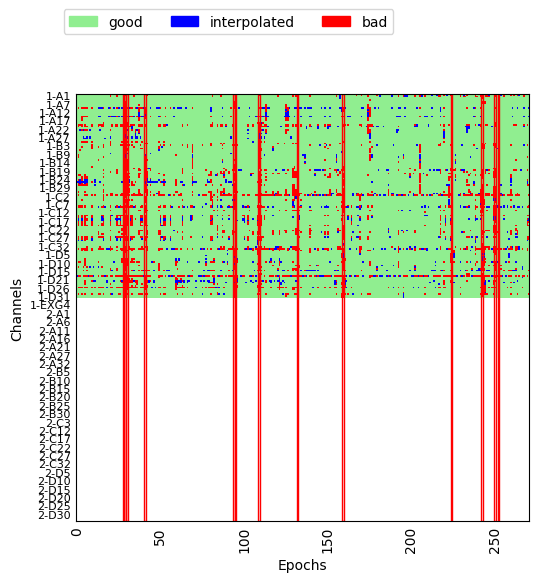

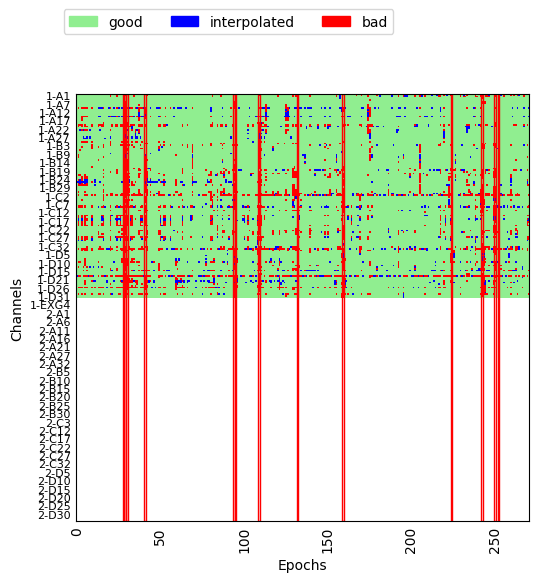

In [56]:
reject_log.plot('horizontal')

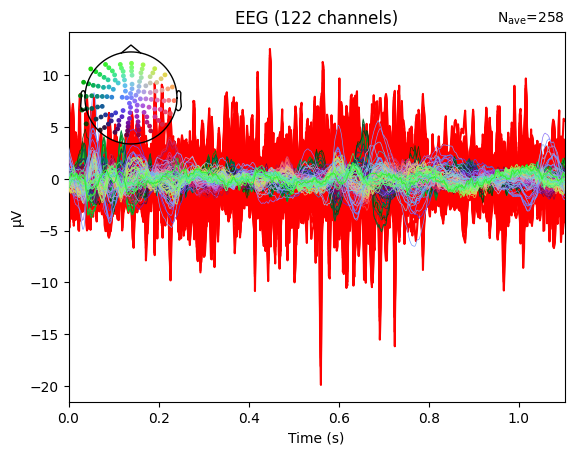

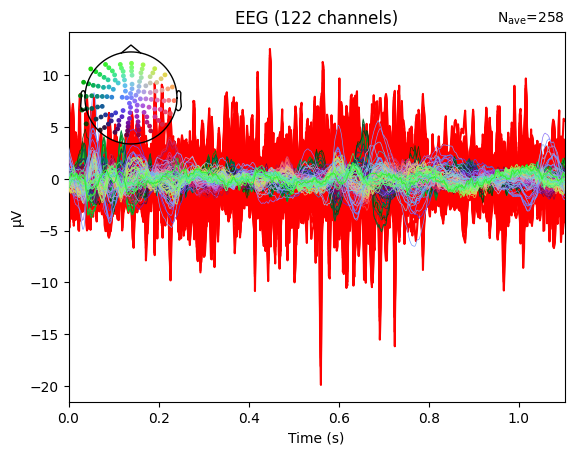

In [57]:
evoked_bad = epochs[reject_log.bad_epochs].average()
plt.figure()
plt.plot(evoked_bad.times, evoked_bad.data.T * 1e6, 'r', zorder=-1)
epochs_ar.average().plot(axes=plt.gca())

Fitting ICA to data using 122 channels (please be patient, this may take a while)
Selecting by number: 20 components
Computing Infomax ICA
Fitting ICA took 212.9s.


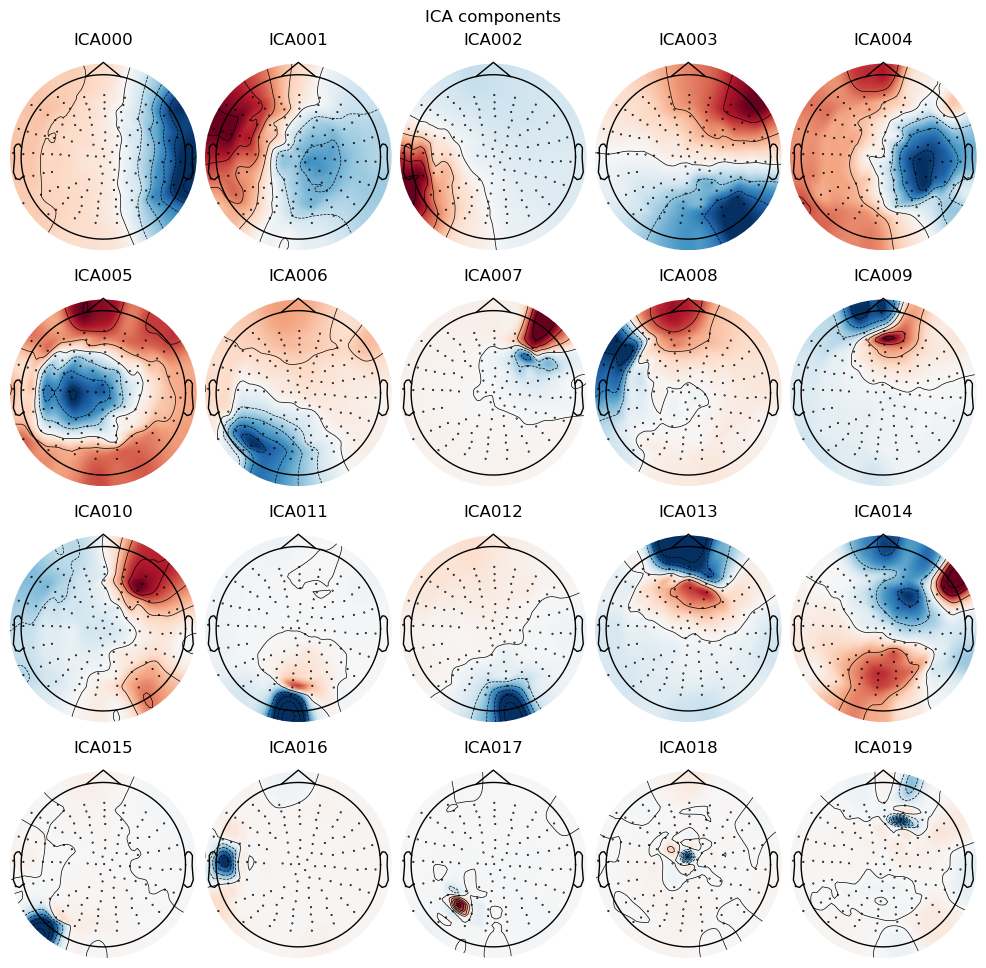

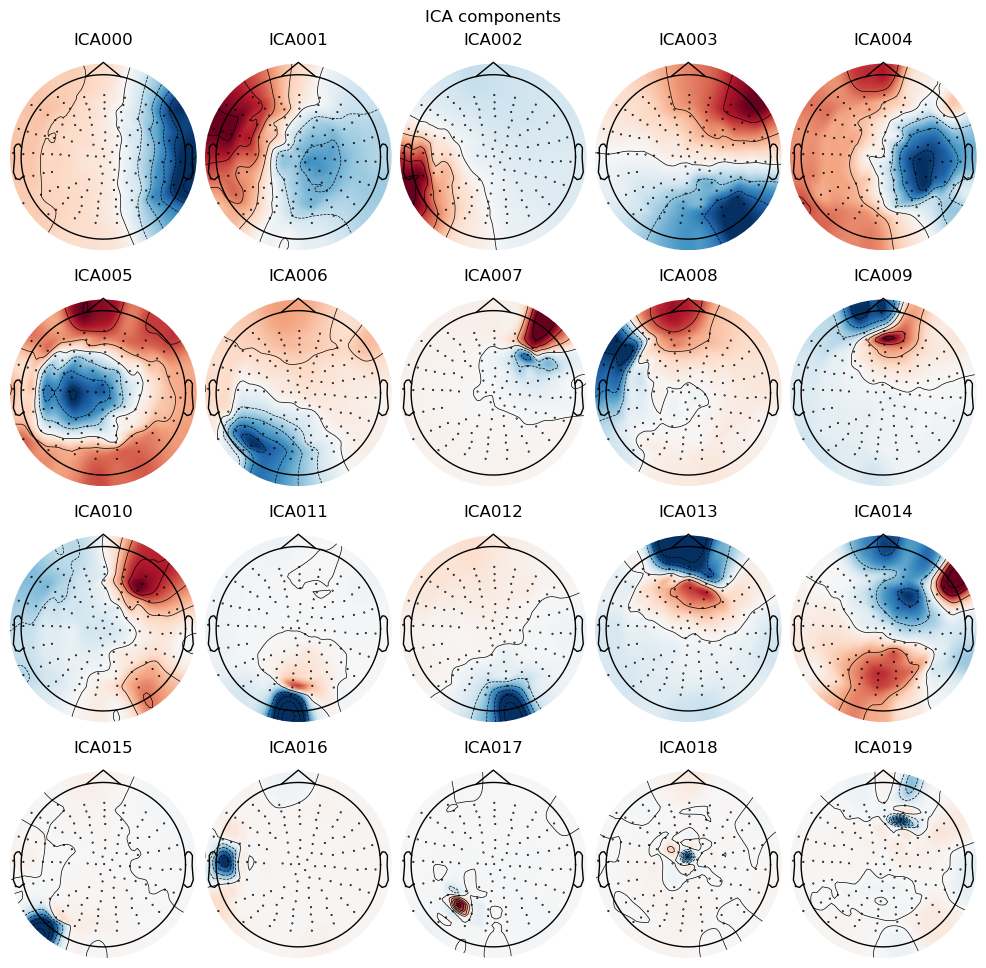

In [9]:
ica = ICA(
    n_components=20,
    method="infomax",
    random_state=97,
    max_iter="auto"
)

ica.fit(raw)

ica.plot_components()

In [10]:
# Exclude artifact components identified by visual inspection of topographies:
# ICA000 - lateral eye movement (EOG)
# ICA001 - eye artifact (EOG)
# ICA002 - blink artifact (EOG)
# ICA005 - frontal muscle / EOG
ica.exclude = [0, 1, 2, 5]

raw_clean = ica.apply(raw.copy())


Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 4 ICA components
    Projecting back using 122 PCA components


## Extract events

In [11]:
events, event_id = mne.events_from_annotations(raw_clean)

print(event_id)

Used Annotations descriptions: [np.str_('9633791'), np.str_('B1'), np.str_('B2'), np.str_('B3'), np.str_('BUTTON'), np.str_('End B1'), np.str_('End B2'), np.str_('End B3'), np.str_('End P1'), np.str_('End P2'), np.str_('End SB1'), np.str_('End SB2'), np.str_('LHS'), np.str_('LTO'), np.str_('P1'), np.str_('P2'), np.str_('RHS'), np.str_('RTO'), np.str_('SB1'), np.str_('SB2'), np.str_('TRIG'), np.str_('boundary')]
{np.str_('9633791'): 1, np.str_('B1'): 2, np.str_('B2'): 3, np.str_('B3'): 4, np.str_('BUTTON'): 5, np.str_('End B1'): 6, np.str_('End B2'): 7, np.str_('End B3'): 8, np.str_('End P1'): 9, np.str_('End P2'): 10, np.str_('End SB1'): 11, np.str_('End SB2'): 12, np.str_('LHS'): 13, np.str_('LTO'): 14, np.str_('P1'): 15, np.str_('P2'): 16, np.str_('RHS'): 17, np.str_('RTO'): 18, np.str_('SB1'): 19, np.str_('SB2'): 20, np.str_('TRIG'): 21, np.str_('boundary'): 22}


In [12]:
rhs_code = event_id["RHS"]  # adjust if label differs

In [13]:
tmin = 0
tmax = 1.2   # adjust based on stride duration

epochs = mne.Epochs(
    raw_clean,
    events,
    event_id=dict(RHS=rhs_code),
    tmin=tmin,
    tmax=tmax,
    baseline=None,
    preload=True
)

print(epochs)

Not setting metadata
2496 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2496 events and 615 original time points ...
0 bad epochs dropped
<Epochs | 2496 events (all good), 0 – 1.199 s (baseline off), ~2.92 GiB, data loaded,
 'RHS': 2496>


## Time Frequency Analysis

In [14]:
freqs = np.arange(13, 31, 1)
n_cycles = freqs / 2  # standard tradeoff
epochs._data = epochs._data.astype("float32")

power = tfr_morlet(
    epochs,
    freqs=np.arange(13, 31, 1),
    n_cycles=freqs/2,
    return_itc=False,
    average=True,  
    decim=2,
    n_jobs=1
)
power.apply_baseline(baseline=None, mode="logratio")

NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").
No baseline correction applied


Data type,Average Power Estimates
Data source,Epochs
Number of epochs,122
Dims,"channel, freq, time"
Estimation method,morlet
Number of channels,122
Number of timepoints,308
Number of frequency bins,18
Frequency range,13.00 – 30.00 Hz


In [42]:
print(power.info["ch_names"])

['1-A1', '1-A2', '1-A3', '1-A5', '1-A6', '1-A7', '1-A8', '1-A9', '1-A10', '1-A11', '1-A12', '1-A13', '1-A14', '1-A15', '1-A16', '1-A17', '1-A18', '1-A19', '1-A20', '1-A21', '1-A22', '1-A23', '1-A24', '1-A25', '1-A26', '1-A27', '1-A28', '1-A29', '1-A30', '1-B1', '1-B3', '1-B4', '1-B5', '1-B6', '1-B7', '1-B9', '1-B10', '1-B11', '1-B12', '1-B13', '1-B14', '1-B15', '1-B16', '1-B17', '1-B18', '1-B19', '1-B20', '1-B21', '1-B22', '1-B23', '1-B24', '1-B25', '1-B26', '1-B27', '1-B28', '1-B29', '1-B30', '1-B31', '1-B32', '1-C1', '1-C2', '1-C3', '1-C4', '1-C5', '1-C6', '1-C7', '1-C8', '1-C9', '1-C10', '1-C11', '1-C12', '1-C13', '1-C14', '1-C15', '1-C16', '1-C17', '1-C18', '1-C19', '1-C20', '1-C21', '1-C22', '1-C23', '1-C24', '1-C25', '1-C26', '1-C27', '1-C28', '1-C29', '1-C30', '1-C31', '1-C32', '1-D1', '1-D2', '1-D3', '1-D4', '1-D5', '1-D6', '1-D7', '1-D8', '1-D9', '1-D10', '1-D11', '1-D12', '1-D13', '1-D14', '1-D15', '1-D16', '1-D17', '1-D18', '1-D20', '1-D21', '1-D22', '1-D23', '1-D24', '1-D25

## Compute mean beta power across channels
For the sensorimotor region only

In [23]:
motor_chs = ["1-A19", "1-A3", "1-A2", "1-A1", "1-C23", "1-C22", "1-C21"]
power_motor = power.copy().pick_channels(motor_chs)

beta_power = power_motor.data.mean(axis=(1,2))  # average freq + channels

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [17]:
print("TFR shape:", power_motor.data.shape)
print("Times shape:", power.times.shape)

TFR shape: (7, 18, 308)
Times shape: (308,)


In [25]:
print(power.times.shape)
print(mean_beta.shape)

(308,)
()


In [26]:
data = power.data  # shape (7, 18, 308)

beta_idx = (power.freqs >= 13) & (power.freqs <= 30)

beta_power = data[:, beta_idx, :]        # (7, beta_freqs, 308)

mean_beta = beta_power.mean(axis=(0, 1)) # average over channels + freqs

print(mean_beta.shape)  # should be (308,)

(308,)


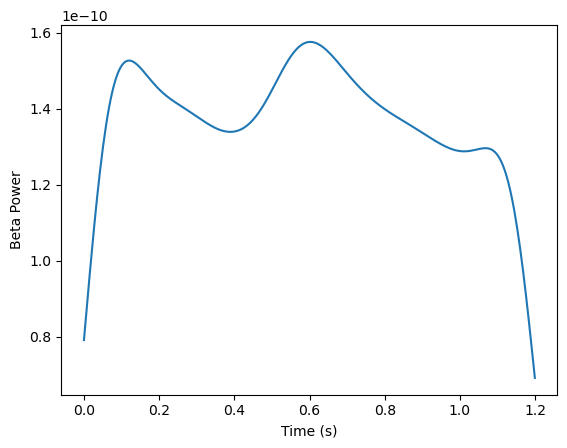

In [27]:
plt.plot(power.times, mean_beta)
plt.xlabel("Time (s)")
plt.ylabel("Beta Power")
plt.show()

## Adaptation Phase

In [34]:
from utils.config import data_dir

events_df = pd.read_csv(
    data_dir(
        bids_path,
        f"sub-S{subject_label}",
        "eeg",
        f"sub-S{subject_label}_task-task_events.tsv"
    ),
    sep="\t"
)

events_df.head()

ModuleNotFoundError: No module named 'utils'

In [40]:

# Whole gait-cycle normalization 
tfr_morelet.apply_baseline(baseline=(0, 1.2), mode='logratio')

tfr_morelet.plot(
    picks='eeg',
    combine='mean',
    title='Beta ERSP – Adaptation – RHS Locked'
)

NameError: name 'tfr_morelet' is not defined

In [41]:
print(f"Current Working Directory: {os.getcwd()}")

Current Working Directory: c:\Vaishali\NG\Multiversebeta\betaGaitMultiverse\scripts
